In [2]:

import types
import pandas as pd
from botocore.client import Config
import ibm_boto3

def __iter__(self): return 0

# @hidden_cell
# The following code accesses a file in your IBM Cloud Object Storage. It includes your credentials.
# You might want to remove those credentials before you share the notebook.
client_410968d42fc843d78070b19685ac648e = ibm_boto3.client(service_name='s3',
    ibm_api_key_id='Jr6Png7dSGUl8llS88F4ycpZR-eh8lo9IiCUDP0RZfH1',
    ibm_auth_endpoint="https://iam.cloud.ibm.com/oidc/token",
    config=Config(signature_version='oauth'),
    endpoint_url='https://s3-api.us-geo.objectstorage.service.networklayer.com')

body = client_410968d42fc843d78070b19685ac648e.get_object(Bucket='pythonbasicsfordatascienceproject-donotdelete-pr-nppeku4azz2ekq',Key='Data-Collisions.csv')['Body']
# add missing __iter__ method, so pandas accepts body as file-like object
if not hasattr(body, "__iter__"): body.__iter__ = types.MethodType( __iter__, body )

df_data_1 = pd.read_csv(body)
df_data_1.head()


/opt/conda/envs/Python36/lib/python3.6/site-packages/IPython/core/interactiveshell.py:3020: DtypeWarning: Columns (33) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,SEVERITYCODE,X,Y,OBJECTID,INCKEY,COLDETKEY,REPORTNO,STATUS,ADDRTYPE,INTKEY,...,ROADCOND,LIGHTCOND,PEDROWNOTGRNT,SDOTCOLNUM,SPEEDING,ST_COLCODE,ST_COLDESC,SEGLANEKEY,CROSSWALKKEY,HITPARKEDCAR
0,2,-122.323148,47.703140,1,1307,1307,3502005,Matched,Intersection,37475.0,...,Wet,Daylight,NaN,NaN,NaN,10,Entering at angle,0,0,N
1,1,-122.347294,47.647172,2,52200,52200,2607959,Matched,Block,NaN,...,Wet,Dark - Street Lights On,NaN,6354039.0,NaN,11,From same direction - both going straight - bo...,0,0,N
2,1,-122.334540,47.607871,3,26700,26700,1482393,Matched,Block,NaN,...,Dry,Daylight,NaN,4323031.0,NaN,32,One parked--one moving,0,0,N
3,1,-122.334803,47.604803,4,1144,1144,3503937,Matched,Block,NaN,...,Dry,Daylight,NaN,NaN,NaN,23,From same direction - all others,0,0,N
4,2,-122.306426,47.545739,5,17700,17700,1807429,Matched,Intersection,34387.0,...,Wet,Daylight,NaN,4028032.0,NaN,10,Entering at angle,0,0,N


Data set is made up of 194,673  entries with 38 columuns.

In [3]:
import numpy as np
np.shape(df_data_1)

(194673, 38)

Check to see balance between severe 2 or not severe 1

In [4]:
df_data_1['SEVERITYCODE'].value_counts()

1    136485
2     58188
Name: SEVERITYCODE, dtype: int64

Rename df as df_raw in case later on there is a need to go back to original data set.  Every cnage to the data set is saved sperately.  in case it needs ot be recalled.

In [5]:
df_raw=df_data_1

In [6]:
df_raw.head()

,SEVERITYCODE,X,Y,OBJECTID,INCKEY,COLDETKEY,REPORTNO,STATUS,ADDRTYPE,INTKEY,...,ROADCOND,LIGHTCOND,PEDROWNOTGRNT,SDOTCOLNUM,SPEEDING,ST_COLCODE,ST_COLDESC,SEGLANEKEY,CROSSWALKKEY,HITPARKEDCAR
0,2,-122.323148,47.703140,1,1307,1307,3502005,Matched,Intersection,37475.0,...,Wet,Daylight,NaN,NaN,NaN,10,Entering at angle,0,0,N
1,1,-122.347294,47.647172,2,52200,52200,2607959,Matched,Block,NaN,...,Wet,Dark - Street Lights On,NaN,6354039.0,NaN,11,From same direction - both going straight - bo...,0,0,N
2,1,-122.334540,47.607871,3,26700,26700,1482393,Matched,Block,NaN,...,Dry,Daylight,NaN,4323031.0,NaN,32,One parked--one moving,0,0,N
3,1,-122.334803,47.604803,4,1144,1144,3503937,Matched,Block,NaN,...,Dry,Daylight,NaN,NaN,NaN,23,From same direction - all others,0,0,N
4,2,-122.306426,47.545739,5,17700,17700,1807429,Matched,Intersection,34387.0,...,Wet,Daylight,NaN,4028032.0,NaN,10,Entering at angle,0,0,N


      Data set is reduced down to the following characterisitcs:       SEVERITYCODE	X	Y	ADDRTYPE	INCDTTM	WEATHER	ROADCOND	LIGHTCOND

In [7]:
df_red=df_raw[['SEVERITYCODE','X','Y','ADDRTYPE','INCDTTM','WEATHER','ROADCOND','LIGHTCOND']]

In [8]:
df_red.head()

,SEVERITYCODE,X,Y,ADDRTYPE,INCDTTM,WEATHER,ROADCOND,LIGHTCOND
0,2,-122.323148,47.703140,Intersection,3/27/2013 14:54,Overcast,Wet,Daylight
1,1,-122.347294,47.647172,Block,12/20/2006 18:55,Raining,Wet,Dark - Street Lights On
2,1,-122.334540,47.607871,Block,11/18/2004 10:20,Overcast,Dry,Daylight
3,1,-122.334803,47.604803,Block,3/29/2013 9:26,Clear,Dry,Daylight
4,2,-122.306426,47.545739,Intersection,1/28/2004 8:04,Raining,Wet,Daylight


In [9]:
df_red['W_code'] = pd.factorize(df_red['WEATHER'])[0] + 1

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


In [10]:
df_red['RDcond_code'] = pd.factorize(df_red['ROADCOND'])[0] + 1

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


In [11]:
df_red['ADDR_code'] = pd.factorize(df_red['ADDRTYPE'])[0] + 1

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


In [12]:
df_red['date_and time'] = pd.to_datetime(df_red['INCDTTM'])
df_red
df_red.dtypes

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


SEVERITYCODE              int64
X                       float64
Y                       float64
ADDRTYPE                 object
INCDTTM                  object
WEATHER                  object
ROADCOND                 object
LIGHTCOND                object
W_code                    int64
RDcond_code               int64
ADDR_code                 int64
date_and time    datetime64[ns]
dtype: object

In [13]:
df_red.head()

,SEVERITYCODE,X,Y,ADDRTYPE,INCDTTM,WEATHER,ROADCOND,LIGHTCOND,W_code,RDcond_code,ADDR_code,date_and time
0,2,-122.323148,47.703140,Intersection,3/27/2013 14:54,Overcast,Wet,Daylight,1,1,1,2013-03-27 14:54:00
1,1,-122.347294,47.647172,Block,12/20/2006 18:55,Raining,Wet,Dark - Street Lights On,2,1,2,2006-12-20 18:55:00
2,1,-122.334540,47.607871,Block,11/18/2004 10:20,Overcast,Dry,Daylight,1,2,2,2004-11-18 10:20:00
3,1,-122.334803,47.604803,Block,3/29/2013 9:26,Clear,Dry,Daylight,3,2,2,2013-03-29 09:26:00
4,2,-122.306426,47.545739,Intersection,1/28/2004 8:04,Raining,Wet,Daylight,2,1,1,2004-01-28 08:04:00


In [14]:
df_red['date_code'] = df_red['date_and time'].dt.dayofweek+1

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


In [15]:
df_red.head()

,SEVERITYCODE,X,Y,ADDRTYPE,INCDTTM,WEATHER,ROADCOND,LIGHTCOND,W_code,RDcond_code,ADDR_code,date_and time,date_code
0,2,-122.323148,47.703140,Intersection,3/27/2013 14:54,Overcast,Wet,Daylight,1,1,1,2013-03-27 14:54:00,3
1,1,-122.347294,47.647172,Block,12/20/2006 18:55,Raining,Wet,Dark - Street Lights On,2,1,2,2006-12-20 18:55:00,3
2,1,-122.334540,47.607871,Block,11/18/2004 10:20,Overcast,Dry,Daylight,1,2,2,2004-11-18 10:20:00,4
3,1,-122.334803,47.604803,Block,3/29/2013 9:26,Clear,Dry,Daylight,3,2,2,2013-03-29 09:26:00,5
4,2,-122.306426,47.545739,Intersection,1/28/2004 8:04,Raining,Wet,Daylight,2,1,1,2004-01-28 08:04:00,3


In [16]:
df_red['LT_code'] = pd.factorize(df_red['LIGHTCOND'])[0] + 1

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


In [17]:
df_coded=df_red[['SEVERITYCODE','X','Y','W_code','RDcond_code','ADDR_code','date_code','LT_code']]

In [18]:
df_red.loc[df_red['W_code'] ==11]

,SEVERITYCODE,X,Y,ADDRTYPE,INCDTTM,WEATHER,ROADCOND,LIGHTCOND,W_code,RDcond_code,ADDR_code,date_and time,date_code,LT_code
180685,1,-122.262050,47.513314,Intersection,1/4/2020 20:48,Partly Cloudy,Dry,Dark - Street Lights On,11,2,1,2020-01-04 20:48:00,6,2
182015,2,-122.272808,47.542476,Intersection,1/15/2020 6:57,Partly Cloudy,Wet,Dawn,11,1,1,2020-01-15 06:57:00,3,6
186308,1,-122.314513,47.621121,Block,3/11/2020 12:00,Partly Cloudy,Dry,Daylight,11,2,2,2020-03-11 12:00:00,3,1
186684,2,-122.361092,47.537954,Intersection,4/4/2020 12:04,Partly Cloudy,Dry,Daylight,11,2,1,2020-04-04 12:04:00,6,1
193057,2,-122.348205,47.627162,Block,3/2/2020 23:32,Partly Cloudy,Dry,Dark - No Street Lights,11,2,2,2020-03-02 23:32:00,1,3


# The df is now coded as integer for specfic conditions.  
     
  Address type is ADDR_code 1- Intersection  2-BLock, 3 is alley
  Time of accident is reduce to day of the week.    0-6  Monday - Sunday 
  
  Weather condtion is Overcast-1 , Raining -2 and Clear -3  Uknown -4,  s other -5,  snowing-6,  fog-7 ,  8 is sleet or freezing rain/hail, Blwsoing sand dirt is 9, 10 is corsswind, 11 is partly cloudy
  
  Road condtion is Wet-1 and Dry-2 , Unkown-3, snow/slush-4,ice-5,other-6, sand mud dirt-7,standing water -8 (standing water code is used in flood prone areas after weather event) ,oil -9 (oil is used when there has been recnelty paved road or if there is an accompanying report of oil spillage). Road condtions are reported regualarly by the Seattle Dept of Tansportation (SDOT).    Codes 1-5 are based on weather condtions and observations as reported by SDOT.  Cod 7 sand mud dirt - is based on location and not by SDO.  Code i8 is rpeorted by SDOT and is basedon  histrocal record of flood prone areas and previous/or current weather.   
  
  Light condition is coded as 1-5  Daylight -1, Dark-Street lights on 2, Dark-no lights-3 , Unkown -4 and Dusk -5.  Need to remove Unknowns  Light condtions are coded based on time of accidnet.  In some cases there are no street ligts in the area.  Police have accesss to inofration as ot what areas do not have stree lights and will code acocrndingly.
  
  
  
  
  

In [19]:
df_coded.head()

,SEVERITYCODE,X,Y,W_code,RDcond_code,ADDR_code,date_code,LT_code
0,2,-122.323148,47.703140,1,1,1,3,1
1,1,-122.347294,47.647172,2,1,2,3,2
2,1,-122.334540,47.607871,1,2,2,4,1
3,1,-122.334803,47.604803,3,2,2,5,1
4,2,-122.306426,47.545739,2,1,1,3,1


In [20]:
df_red.loc[df_red['ADDR_code'] == 3] 

,SEVERITYCODE,X,Y,ADDRTYPE,INCDTTM,WEATHER,ROADCOND,LIGHTCOND,W_code,RDcond_code,ADDR_code,date_and time,date_code,LT_code
10,1,NaN,NaN,Alley,5/25/2006 18:20,Overcast,Dry,Daylight,1,2,3,2006-05-25 18:20:00,4,1
261,1,NaN,NaN,Alley,6/4/2005,Unknown,Unknown,Unknown,4,3,3,2005-06-04 00:00:00,6,4
357,1,NaN,NaN,Alley,1/13/2006 8:43,Raining,Wet,Daylight,2,1,3,2006-01-13 08:43:00,5,1
830,1,NaN,NaN,Alley,12/8/2004,Raining,Wet,Dark - Street Lights On,2,1,3,2004-12-08 00:00:00,3,2
889,1,NaN,NaN,Alley,12/16/2006 20:19,Clear,Dry,Dark - Street Lights On,3,2,3,2006-12-16 20:19:00,6,2
1109,1,NaN,NaN,Alley,6/21/2013 15:04,Clear,Dry,Daylight,3,2,3,2013-06-21 15:04:00,5,1
1110,1,NaN,NaN,Alley,1/22/2008 20:00,Clear,Ice,Dark - Street Lights Off,3,5,3,2008-01-22 20:00:00,2,7
1221,1,NaN,NaN,Alley,1/19/2013 23:58,Fog/Smog/Smoke,Dry,Dark - Street Lights On,7,2,3,2013-01-19 23:58:00,6,2
1585,1,NaN,NaN,Alley,10/16/2007 16:00,Unknown,Unknown,Daylight,4,3,3,2007-10-16 16:00:00,2,1
1816,1,NaN,NaN,Alley,2/13/2015 19:00,Unknown,Unknown,Unknown,4,3,3,2015-02-13 19:00:00,5,4


# Codes with Unknown or other are dropped

In [21]:
df_drop=df_coded[df_coded.W_code != 4]


In [22]:
df_drop=df_drop[df_drop.W_code !=4]
df_drop=df_drop[df_drop.W_code !=5]

In [23]:
df_drop=df_drop[df_drop.RDcond_code !=3]

In [24]:
df_drop=df_drop[df_drop.RDcond_code !=6]

In [25]:
df_drop=df_drop[df_drop.LT_code !=4]
df_drop=df_drop[df_drop.LT_code !=8]

In [26]:
df_final=df_drop.dropna()

In [27]:
np.shape(df_final)

(171317, 8)

# "Unknown" and "others" have been removed.  Codes are shifted so that code 6 is now coded as  5 etc.

In [28]:
df_final.loc[df_final['W_code'] == 6, 'W_code']=4  
df_final.loc[df_final['W_code'] == 7, 'W_code']=5  
df_final.loc[df_final['W_code'] == 8, 'W_code']=6  
df_final.loc[df_final['W_code'] == 9, 'W_code']=7
df_final.loc[df_final['W_code'] == 10, 'W_code']=8  
df_final.loc[df_final['W_code'] == 11, 'W_code']=9  

/opt/conda/envs/Python36/lib/python3.6/site-packages/pandas/core/indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


In [29]:
df_final.loc[df_final['RDcond_code'] == 4, 'RDcond_code']=3  
df_final.loc[df_final['RDcond_code'] == 5, 'RDcond_code']=4  
df_final.loc[df_final['RDcond_code'] == 7, 'RDcond_code']=5
df_final.loc[df_final['RDcond_code'] == 8, 'RDcond_code']=6 
df_final.loc[df_final['RDcond_code'] == 9, 'RDcond_code']=7  

In [30]:

df_final.loc[df_final['LT_code'] == 5, 'LT_code']=4 

df_final.loc[df_final['LT_code'] == 6, 'LT_code']=5
df_final.loc[df_final['LT_code'] == 7, 'LT_code']=6 
df_final.loc[df_final['LT_code'] == 9, 'LT_code']=7 

In [31]:
df_final.head()

,SEVERITYCODE,X,Y,W_code,RDcond_code,ADDR_code,date_code,LT_code
0,2,-122.323148,47.703140,1,1,1,3,1
1,1,-122.347294,47.647172,2,1,2,3,2
2,1,-122.334540,47.607871,1,2,2,4,1
3,1,-122.334803,47.604803,3,2,2,5,1
4,2,-122.306426,47.545739,2,1,1,3,1


In [32]:
df_final=df_final[df_final.W_code != 0]
df_final=df_final[df_final.W_code != 9]
df_final=df_final[df_final.RDcond_code != 0]
df_final=df_final[df_final.LT_code != 0]
df_final=df_final[df_final.ADDR_code != 0]


In [35]:
np.shape(df_final)

(166212, 8)

# After data is coded we look at ther % of 1- not severe vs. 2 sever accidents for each characteristic.

In [35]:
df_date_sort=df_final['SEVERITYCODE'].groupby(df_final['date_code']).value_counts(normalize=True)

In [36]:
df_date_sort

date_code  SEVERITYCODE
1          1               0.664414
           2               0.335586
2          1               0.664439
           2               0.335561
3          1               0.665462
           2               0.334538
4          1               0.660605
           2               0.339395
5          1               0.675288
           2               0.324712
6          1               0.677415
           2               0.322585
7          1               0.692944
           2               0.307056
Name: SEVERITYCODE, dtype: float64

In [37]:
df_weat_sort=df_final['SEVERITYCODE'].groupby(df_final['W_code']).value_counts(normalize=True)

In [38]:
df_weat_sort

W_code  SEVERITYCODE
1       1               0.678039
        2               0.321961
2       1               0.658354
        2               0.341646
3       1               0.671678
        2               0.328322
4       1               0.801968
        2               0.198032
5       1               0.664804
        2               0.335196
6       1               0.745283
        2               0.254717
7       1               0.714286
        2               0.285714
8       1               0.708333
        2               0.291667
Name: SEVERITYCODE, dtype: float64

In [39]:
df_RD_sort=df_final['SEVERITYCODE'].groupby(df_final['RDcond_code']).value_counts(normalize=True)

In [40]:
df_RD_sort

RDcond_code  SEVERITYCODE
1            1               0.662672
             2               0.337328
2            1               0.672180
             2               0.327820
3            1               0.812424
             2               0.187576
4            1               0.757346
             2               0.242654
5            1               0.625000
             2               0.375000
6            1               0.734043
             2               0.265957
7            1               0.591837
             2               0.408163
Name: SEVERITYCODE, dtype: float64

In [41]:
df_LT_sort=df_final['SEVERITYCODE'].groupby(df_final['LT_code']).value_counts(normalize=True)
df_LT_sort

LT_code  SEVERITYCODE
1        1               0.660521
         2               0.339479
2        1               0.693358
         2               0.306642
3        1               0.769520
         2               0.230480
4        1               0.661424
         2               0.338576
5        1               0.661387
         2               0.338613
6        1               0.720822
         2               0.279178
7        1               0.625000
         2               0.375000
Name: SEVERITYCODE, dtype: float64

In [42]:
df_ADDR_sort=df_final['SEVERITYCODE'].groupby(df_final['ADDR_code']).value_counts(normalize=True)
df_ADDR_sort

ADDR_code  SEVERITYCODE
1          1               0.561927
           2               0.438073
2          1               0.733926
           2               0.266074
Name: SEVERITYCODE, dtype: float64

Most show a 66:33 split between 1-not severe and 2-severe.  No obvious factor which impacts severity alone other tan some slight trend to a 70:30 split for some. Ex. is increase as you go into weekned with a peak on Sunday of 69:31.     Some exceptions are Weather at parlty cloud with a 60:40 split.  This was investigated and was found there were only 5 occruences recorded as partky cloudly.  This seemsed very unlikley.  TO avoid any bias it was dtermined that it would be best to drop the partly cloudy entries.  

In [43]:
df_final['SEVERITYCODE'].value_counts()

1    111501
2     54711
Name: SEVERITYCODE, dtype: int64

In [44]:
df_Severe_only=df_final[df_final.SEVERITYCODE !=1]


In [45]:
np.shape(df_Severe_only)

(54711, 8)

In [95]:
df_Severe_only.head(50)

,SEVERITYCODE,X,Y,W_code,RDcond_code,ADDR_code,date_code,LT_code
0,2,-122.323148,47.703140,1,1,1,3,1
4,2,-122.306426,47.545739,2,1,1,3,1
7,2,-122.320780,47.614076,3,2,1,3,1
9,2,-122.384700,47.528475,3,2,1,1,1
14,2,-122.317414,47.664028,3,2,2,7,2
16,2,-122.344539,47.692012,1,2,1,5,1
18,2,-122.328270,47.571420,3,2,2,5,1
20,2,-122.292403,47.732847,3,2,2,3,2
21,2,-122.313786,47.708535,3,2,1,4,1
24,2,-122.279658,47.553405,3,2,1,7,1


In [46]:
df_Severe_not=df_final[df_final.SEVERITYCODE !=2]

In [47]:
np.shape(df_Severe_not)

(111501, 8)

In [97]:
df_Severe_not.head(250)

,SEVERITYCODE,X,Y,W_code,RDcond_code,ADDR_code,date_code,LT_code
1,1,-122.347294,47.647172,2,1,2,3,2
2,1,-122.334540,47.607871,1,2,2,4,1
3,1,-122.334803,47.604803,3,2,2,5,1
5,1,-122.387598,47.690575,3,2,1,6,1
6,1,-122.338485,47.618534,2,1,1,2,1
8,1,-122.335930,47.611904,3,2,2,4,1
11,1,-122.333831,47.547371,3,2,1,4,1
12,1,-122.356273,47.571375,2,1,2,3,2
13,1,-122.323966,47.606374,2,1,2,4,3
22,1,-122.318169,47.615837,3,2,2,5,2


In [48]:
df_not_Sev_red=df_Severe_not.sample(frac=0.5,  random_state=1)

In [49]:
np.shape(df_not_Sev_red)

(55750, 8)

In [76]:
df_final_bal=pd.concat([df_Severe_only,df_not_Sev_red], ignore_index=True)
df_final_bal=df_final_bal.sample(frac=1).reset_index(drop=True)
df_final_bal.head(20)

,SEVERITYCODE,X,Y,W_code,RDcond_code,ADDR_code,date_code,LT_code
0,1,-122.324546,47.656726,3,2,2,7,2
1,1,-122.287237,47.567936,2,1,1,5,1
2,2,-122.333264,47.589272,3,2,2,6,1
3,1,-122.342280,47.723211,3,2,1,2,1
4,1,-122.344010,47.651625,3,2,2,4,5
5,2,-122.345186,47.618561,1,2,2,7,2
6,1,-122.318029,47.661301,3,2,2,1,1
7,1,-122.356709,47.624583,1,1,1,4,2
8,2,-122.339174,47.613727,3,2,1,1,2
9,2,-122.348567,47.664299,3,1,1,2,1


In [51]:
np.shape(df_final_bal)

(110461, 8)

In [52]:
df_final_bal['SEVERITYCODE'].value_counts()

1    55750
2    54711
Name: SEVERITYCODE, dtype: int64

We have 4 DF to work with.  df_final is the unbalanced df with encoding.  df_final_bal is the balanced df with encoding.   df_Severe_not is only the not severe accidents and df_Severe_only are ony the Severe accidents.


# Mapping out incident 
   Plotting the incidents on the map will allow us to see if there are certaina reas of the city where accidnets frequently occur.  We will map all incidnets and only incindets that are severe (code 2).

In [51]:
!conda install -c conda-forge folium=0.5.0 --yes

Solving environment: done

## Package Plan ##

  environment location: /opt/conda/envs/Python36

  added / updated specs: 
    - folium=0.5.0


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    altair-4.1.0               |             py_1         614 KB  conda-forge
    python_abi-3.6             |          1_cp36m           4 KB  conda-forge
    ca-certificates-2020.6.20  |       hecda079_0         145 KB  conda-forge
    openssl-1.1.1g             |       h516909a_1         2.1 MB  conda-forge
    folium-0.5.0               |             py_0          45 KB  conda-forge
    certifi-2020.6.20          |   py36h9f0ad1d_0         151 KB  conda-forge
    vincent-0.4.4              |             py_1          28 KB  conda-forge
    branca-0.4.1               |             py_0          26 KB  conda-forge
    ------------------------------------------------------------
                       

In [52]:
import folium
from folium import Map
from folium.plugins import HeatMap

In [53]:
map_df_final=df_final

In [54]:
map_df_final.head()

,SEVERITYCODE,X,Y,W_code,RDcond_code,ADDR_code,date_code,LT_code
0,2,-122.323148,47.703140,1,1,1,3,1
1,1,-122.347294,47.647172,2,1,2,3,2
2,1,-122.334540,47.607871,1,2,2,4,1
3,1,-122.334803,47.604803,3,2,2,5,1
4,2,-122.306426,47.545739,2,1,1,3,1


In [55]:
final_map=Map(location=[47.608013,-122.335167], zoom_start=12,)

In [56]:
hm_wide=HeatMap(list(zip(map_df_final.Y.values,map_df_final.X.values)),min_opacity=0.2, radius=5, blur=5, max_zoom=1,)

In [57]:
final_map.add_child(hm_wide)

In [58]:
map_df_severe_only=df_Severe_only

In [59]:
final_map_sev=Map(location=[47.608013,-122.335167], zoom_start=12,)

In [60]:
hm_wide_2=HeatMap(list(zip(map_df_severe_only.Y.values,map_df_severe_only.X.values)),min_opacity=0.2, radius=5, blur=5, max_zoom=1,)

In [61]:
final_map_sev.add_child(hm_wide_2)

In [62]:
map_df_severe_not=df_not_Sev_red

In [63]:
np.shape(map_df_severe_not)

(55750, 8)

In [64]:
final_map_not_sev=Map(location=[47.608013,-122.335167], zoom_start=12,)

In [65]:
hm_wide_3=HeatMap(list(zip(map_df_severe_not.Y.values,map_df_severe_not.X.values)),min_opacity=0.2, radius=5, blur=5, max_zoom=1,)

In [66]:
final_map_not_sev.add_child(hm_wide_3)

In [53]:
Bal_X = np.asarray(df_final_bal[['X','Y','W_code','RDcond_code','ADDR_code','date_code','LT_code']])
Bal_y= np.asarray(df_final_bal[['SEVERITYCODE']])

In [54]:
from sklearn import preprocessing
Bal_X = preprocessing.StandardScaler().fit(Bal_X).transform(Bal_X)
Bal_X[0:5]

array([[ 0.33590845,  0.00751029,  0.6311053 ,  0.49672642,  0.81190911,
        -0.4843485 , -0.54448861],
       [-1.11245912, -0.91234075, -1.92209287,  0.49672642,  0.81190911,
        -1.00624423, -0.54448861],
       [-1.89107468, -1.43488634,  0.6311053 ,  4.42828966,  0.81190911,
         0.55944297,  0.60145321],
       [ 2.37181573, -2.16505407,  0.6311053 ,  0.49672642, -1.23166497,
         0.55944297,  2.89333686],
       [ 1.05676127,  0.09966682, -0.64549378, -1.46905521, -1.23166497,
         0.03754724,  0.60145321]])

In [55]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split( Bal_X, Bal_y, test_size=0.2, random_state=4)
print ('Train set:', X_train.shape,  y_train.shape)
print ('Test set:', X_test.shape,  y_test.shape)

Train set: (88368, 7) (88368, 1)
Test set: (22093, 7) (22093, 1)


In [56]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix
LR = LogisticRegression(C=0.01, solver='liblinear').fit(X_train,y_train)
LR

/opt/conda/envs/Python36/lib/python3.6/site-packages/sklearn/utils/validation.py:761: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


LogisticRegression(C=0.01, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='liblinear',
          tol=0.0001, verbose=0, warm_start=False)

In [57]:
yhat = LR.predict(X_test)
yhat

array([1, 1, 1, ..., 1, 1, 1], dtype=int64)

In [58]:
yhat_prob = LR.predict_proba(X_test)
yhat_prob

array([[0.58781462, 0.41218538],
       [0.56267069, 0.43732931],
       [0.60019442, 0.39980558],
       ...,
       [0.57684888, 0.42315112],
       [0.58456012, 0.41543988],
       [0.58359677, 0.41640323]])

In [60]:
from sklearn.metrics import jaccard_similarity_score
jaccard_similarity_score(y_test, yhat)

0.5901869370388811

In [61]:
from sklearn.metrics import log_loss
log_loss(y_test, yhat_prob)

0.6757604969201163

In [68]:
from sklearn.metrics import classification_report, confusion_matrix
import itertools
import matplotlib.pyplot as plt
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
print(confusion_matrix(y_test, yhat, labels=[1,2]))

[[7589 3627]
 [5407 5470]]


Confusion matrix, without normalization
[[7589 3627]
 [5407 5470]]


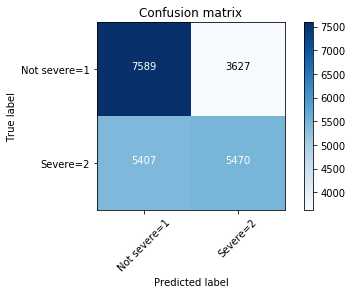

In [69]:
cnf_matrix = confusion_matrix(y_test, yhat, labels=[1,2])
np.set_printoptions(precision=2)


# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=['Not severe=1','Severe=2'],normalize= False,  title='Confusion matrix')

In [70]:
print (classification_report(y_test, yhat))


              precision    recall  f1-score   support

           1       0.58      0.68      0.63     11216
           2       0.60      0.50      0.55     10877

   micro avg       0.59      0.59      0.59     22093
   macro avg       0.59      0.59      0.59     22093
weighted avg       0.59      0.59      0.59     22093



In [71]:
import pandas as pd
import pylab as pl
import numpy as np
import scipy.optimize as opt
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

In [72]:
from sklearn import svm
Sev_SVM= svm.SVC(kernel='rbf')
Sev_SVM.fit(X_train, y_train) 

/opt/conda/envs/Python36/lib/python3.6/site-packages/sklearn/utils/validation.py:761: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/envs/Python36/lib/python3.6/site-packages/sklearn/svm/base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


KeyboardInterrupt: 

In [ ]:
yhat = Sev_SVM.predict(X_test)

In [63]:
from sklearn.metrics import jaccard_similarity_score
jaccard_similarity_score(y_test, yhat)

0.5910922011496854

In [66]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

              precision    recall  f1-score   support

           1       0.58      0.68      0.63     11216
           2       0.60      0.50      0.55     10877

   micro avg       0.59      0.59      0.59     22093
   macro avg       0.59      0.59      0.59     22093
weighted avg       0.59      0.59      0.59     22093

Confusion matrix, without normalization
[[7589 3627]
 [5407 5470]]


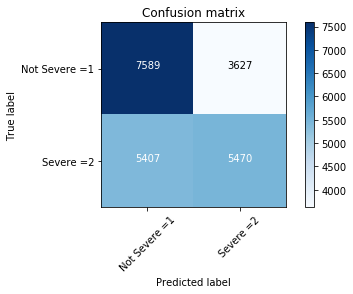

In [73]:
Sev_SVM_matrix = confusion_matrix(y_test, yhat, labels=[1,2])
np.set_printoptions(precision=2)

print (classification_report(y_test, yhat))

# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(Sev_SVM_matrix, classes=['Not Severe =1','Severe =2'],normalize= False,  title='Confusion matrix')

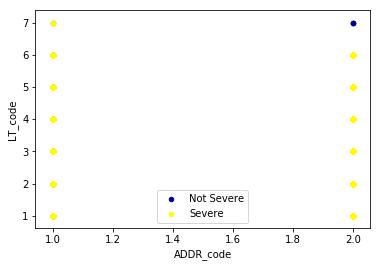

In [108]:
ax = df_final_bal[df_final_bal['SEVERITYCODE'] == 1].plot(kind='scatter', x='ADDR_code', y='LT_code', color='DarkBlue', label='Not Severe');
df_final_bal[df_final_bal['SEVERITYCODE'] == 2].plot(kind='scatter', x='ADDR_code', y='LT_code', color='Yellow', label='Severe', ax=ax);
plt.show ()

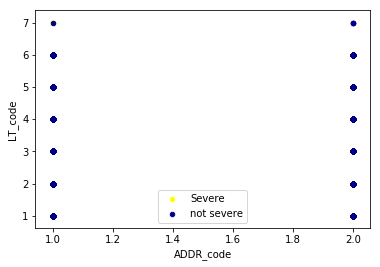

In [107]:
ax = df_final_bal[df_final_bal['SEVERITYCODE'] == 2].plot(kind='scatter', x='ADDR_code', y='LT_code', color='Yellow', label= 'Severe');
df_final_bal[df_final_bal['SEVERITYCODE'] == 1].plot(kind='scatter', x='ADDR_code', y='LT_code', color='DarkBlue', label='not severe', ax=ax);
plt.show ()

In [102]:
df_final_bal.head(250)

,SEVERITYCODE,X,Y,W_code,RDcond_code,ADDR_code,date_code,LT_code
0,1,-122.324546,47.656726,3,2,2,7,2
1,1,-122.287237,47.567936,2,1,1,5,1
2,2,-122.333264,47.589272,3,2,2,6,1
3,1,-122.342280,47.723211,3,2,1,2,1
4,1,-122.344010,47.651625,3,2,2,4,5
5,2,-122.345186,47.618561,1,2,2,7,2
6,1,-122.318029,47.661301,3,2,2,1,1
7,1,-122.356709,47.624583,1,1,1,4,2
8,2,-122.339174,47.613727,3,2,1,1,2
9,2,-122.348567,47.664299,3,1,1,2,1


In [113]:
df_final_bal['W_code'].value_counts()

3    70719
2    21255
1    17502
4      502
5      364
6       73
7       28
8       18
Name: W_code, dtype: int64

In [116]:
df_final_bal['RDcond_code'].value_counts()

2    78924
1    30258
4      654
3      487
6       61
5       39
7       38
Name: RDcond_code, dtype: int64

In [121]:
df_RD_sort=df_final['SEVERITYCODE'].groupby(df_final['RDcond_code']).value_counts(normalize=True)
df_RD_sort

RDcond_code  SEVERITYCODE
1            1               0.662672
             2               0.337328
2            1               0.672180
             2               0.327820
3            1               0.812424
             2               0.187576
4            1               0.757346
             2               0.242654
5            1               0.625000
             2               0.375000
6            1               0.734043
             2               0.265957
7            1               0.591837
             2               0.408163
Name: SEVERITYCODE, dtype: float64

In [117]:
df_final_bal['ADDR_code'].value_counts()

2    66575
1    43886
Name: ADDR_code, dtype: int64

In [122]:
df_ADDR_sort_bal=df_final_bal['SEVERITYCODE'].groupby(df_final_bal['ADDR_code']).value_counts(normalize=True)
df_ADDR_sort_bal

ADDR_code  SEVERITYCODE
1          2               0.608577
           1               0.391423
2          1               0.579377
           2               0.420623
Name: SEVERITYCODE, dtype: float64

In [118]:
df_final_bal['LT_code'].value_counts()

1    73745
2    29869
4     3779
5     1563
3      835
6      663
7        7
Name: LT_code, dtype: int64

In [119]:
df_final_bal['date_code'].value_counts()

5    18380
4    16735
3    16480
2    16270
6    15437
1    14943
7    12216
Name: date_code, dtype: int64